In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# Training with data augmentation

In [6]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [17]:
class CNNNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(CNNNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Conv2d(C, 32, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(32, 64, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(64, 128, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(128, 256, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
        )

        self.classifier = nn.Sequential(
            nn.Linear(int(W/16*H/16*256), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, P*D)
        )
        
        self._weights_init()
        
    def _weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.xavier_normal(m.weight.data)

    def forward(self, x):    
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = self.features(x)
        
        x = x.view(-1, int(W/16*H/16*256))
        
        x = self.classifier(x)
        
        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [18]:
from cpe775.dataset import FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray, RandomHorizontalFlip

In [19]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [20]:
train_transforms = Compose([
                   CropFace(enlarge_ratio=1.7),
                   RandomHorizontalFlip(),
                   ToGray(),
                   ToTensor()
                 ])

transforms = Compose([
                   CropFace(enlarge_ratio=1.7),
                   ToGray(),
                   ToTensor()
                 ])

In [21]:
# load the dataset
train_dataset = FaceLandmarksDataset(csv_file='../data/train.csv',
                                     root_dir='../data/',
                                     transform=train_transforms)
valid_dataset = FaceLandmarksDataset(csv_file='../data/train.csv',
                                     root_dir='../data/',
                                     transform=transforms)

num_train = len(train_dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [22]:
net = CNNNet((1, 256, 256), (68, 2)) # input shape, output shape

In [23]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [24]:
np.sum([v.numel() for v in net.parameters()])

17200264

## Creating the loss function

In [25]:
import torch
from cpe775.criterion import RMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [26]:
criterion = RMSELoss()
criterion = criterion.cuda()

In [27]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [28]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/cnnnet/checkpoint-data-aug.pth.tar', 'val_loss', mode='min')
    ]

In [29]:
model.fit_loader(train_loader, 100, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list))

Epoch: [0][0/79]	Time 3.298 (3.298)	Data 1.913 (1.913)	Train Loss 2.109 (2.109)	
Epoch: [0][40/79]	Time 0.069 (0.396)	Data 0.000 (0.316)	Train Loss 0.292 (0.814)	
Val: [0/20]	Time 2.398 (2.398)	Data 2.375 (2.375)	Val Loss 0.167 (0.167)	
Epoch: [1][0/79]	Time 1.750 (1.750)	Data 1.722 (1.722)	Train Loss 0.179 (0.179)	
Epoch: [1][40/79]	Time 0.728 (0.417)	Data 0.703 (0.376)	Train Loss 0.168 (0.194)	
Val: [0/20]	Time 1.401 (1.401)	Data 1.378 (1.378)	Val Loss 0.236 (0.236)	
Epoch: [2][0/79]	Time 1.338 (1.338)	Data 1.311 (1.311)	Train Loss 0.239 (0.239)	
Epoch: [2][40/79]	Time 0.487 (0.378)	Data 0.461 (0.336)	Train Loss 0.165 (0.189)	
Val: [0/20]	Time 1.353 (1.353)	Data 1.329 (1.329)	Val Loss 0.210 (0.210)	
Epoch: [3][0/79]	Time 1.847 (1.847)	Data 1.818 (1.818)	Train Loss 0.179 (0.179)	
Epoch: [3][40/79]	Time 0.473 (0.390)	Data 0.448 (0.349)	Train Loss 0.172 (0.182)	
Val: [0/20]	Time 1.469 (1.469)	Data 1.446 (1.446)	Val Loss 0.165 (0.165)	
Epoch: [4][0/79]	Time 2.267 (2.267)	Data 2.236 (2.23

Val: [0/20]	Time 1.560 (1.560)	Data 1.537 (1.537)	Val Loss 0.085 (0.085)	
Epoch: [35][0/79]	Time 2.498 (2.498)	Data 2.471 (2.471)	Train Loss 0.066 (0.066)	
Epoch: [35][40/79]	Time 0.070 (0.475)	Data 0.000 (0.428)	Train Loss 0.075 (0.066)	
Val: [0/20]	Time 1.270 (1.270)	Data 1.247 (1.247)	Val Loss 0.077 (0.077)	
Epoch: [36][0/79]	Time 1.833 (1.833)	Data 1.807 (1.807)	Train Loss 0.076 (0.076)	
Epoch: [36][40/79]	Time 0.968 (0.402)	Data 0.941 (0.356)	Train Loss 0.066 (0.066)	
Val: [0/20]	Time 2.140 (2.140)	Data 2.117 (2.117)	Val Loss 0.069 (0.069)	
Epoch: [37][0/79]	Time 1.649 (1.649)	Data 1.622 (1.622)	Train Loss 0.055 (0.055)	
Epoch: [37][40/79]	Time 0.070 (0.471)	Data 0.000 (0.429)	Train Loss 0.069 (0.067)	
Val: [0/20]	Time 2.325 (2.325)	Data 2.302 (2.302)	Val Loss 0.072 (0.072)	
Epoch: [38][0/79]	Time 1.821 (1.821)	Data 1.791 (1.791)	Train Loss 0.070 (0.070)	
Epoch: [38][40/79]	Time 0.641 (0.474)	Data 0.614 (0.437)	Train Loss 0.080 (0.068)	
Val: [0/20]	Time 2.196 (2.196)	Data 2.173 (2

Epoch: [69][0/79]	Time 1.966 (1.966)	Data 1.940 (1.940)	Train Loss 0.038 (0.038)	
Epoch: [69][40/79]	Time 0.071 (0.395)	Data 0.000 (0.351)	Train Loss 0.043 (0.041)	
Val: [0/20]	Time 1.631 (1.631)	Data 1.608 (1.608)	Val Loss 0.063 (0.063)	
Epoch: [70][0/79]	Time 1.431 (1.431)	Data 1.403 (1.403)	Train Loss 0.039 (0.039)	
Epoch: [70][40/79]	Time 0.372 (0.356)	Data 0.345 (0.314)	Train Loss 0.043 (0.041)	
Val: [0/20]	Time 1.887 (1.887)	Data 1.863 (1.863)	Val Loss 0.065 (0.065)	
Epoch: [71][0/79]	Time 1.661 (1.661)	Data 1.634 (1.634)	Train Loss 0.048 (0.048)	
Epoch: [71][40/79]	Time 0.396 (0.370)	Data 0.369 (0.334)	Train Loss 0.055 (0.050)	
Val: [0/20]	Time 1.497 (1.497)	Data 1.474 (1.474)	Val Loss 0.066 (0.066)	
Epoch: [72][0/79]	Time 1.619 (1.619)	Data 1.591 (1.591)	Train Loss 0.044 (0.044)	
Epoch: [72][40/79]	Time 0.070 (0.346)	Data 0.033 (0.304)	Train Loss 0.042 (0.042)	
Val: [0/20]	Time 1.564 (1.564)	Data 1.541 (1.541)	Val Loss 0.061 (0.061)	
Epoch: [73][0/79]	Time 1.320 (1.320)	Data 1.

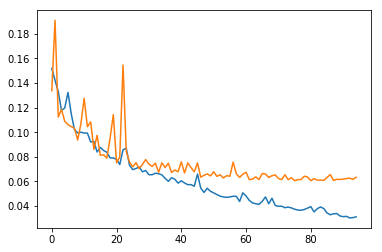

In [30]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [31]:
checkpoint = torch.load('../results/cnnnet/checkpoint-data-aug.pth-best.tar')

## Loading the best model

In [32]:
from cpe775.utils.img_utils import show_landmarks_batch

In [33]:
best_model = Model(CNNNet((1, 256, 256), (68, 2)))
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

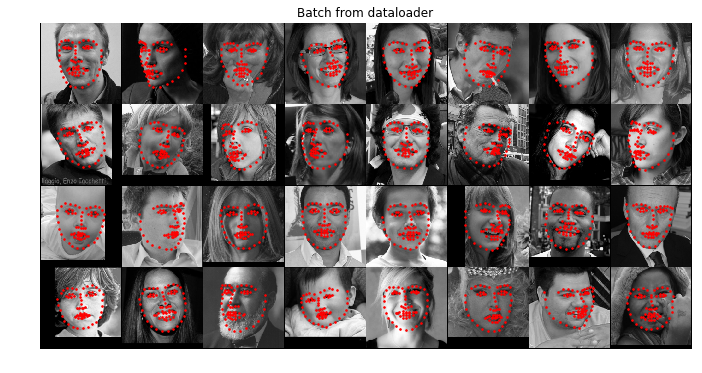

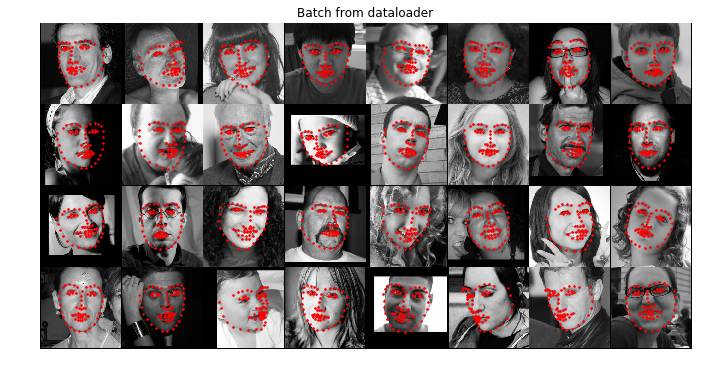

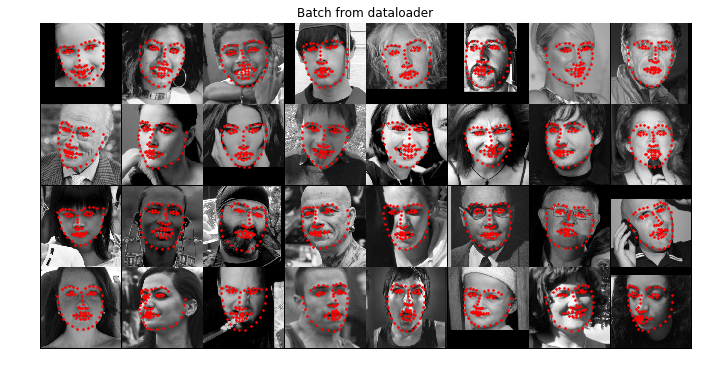

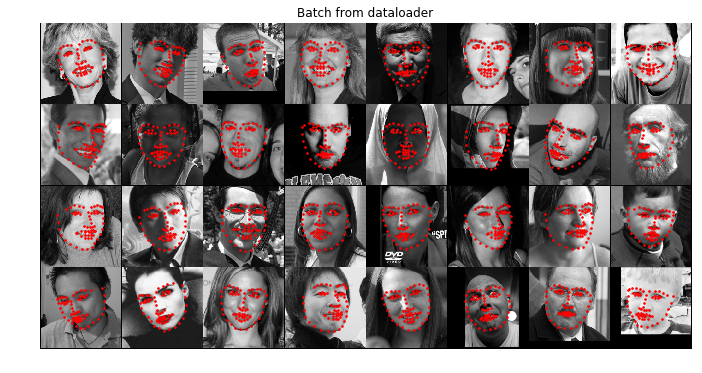

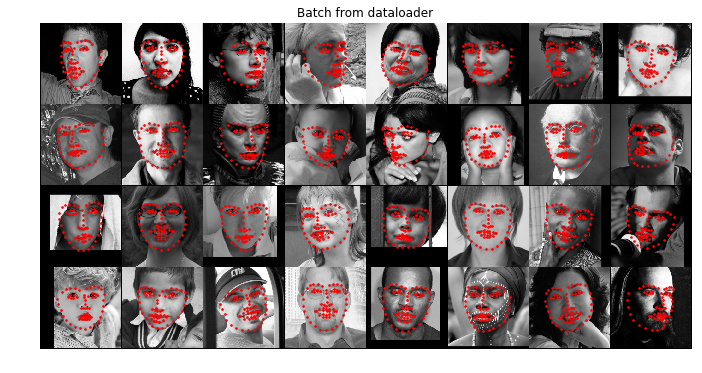

...

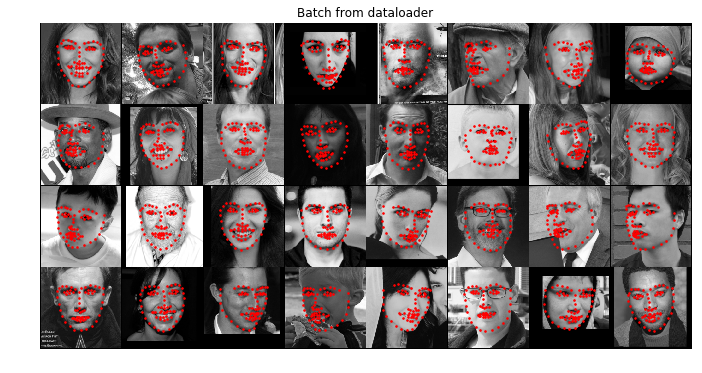

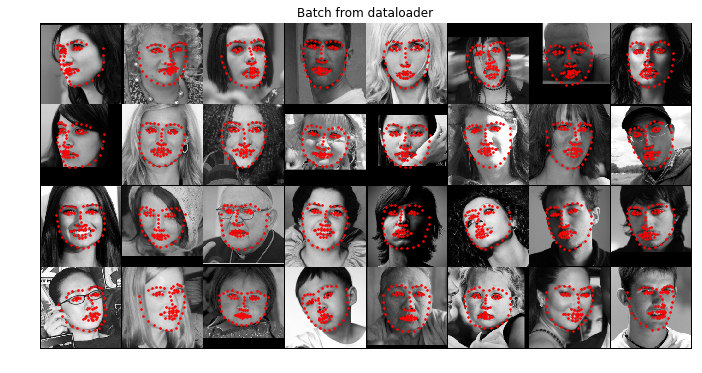

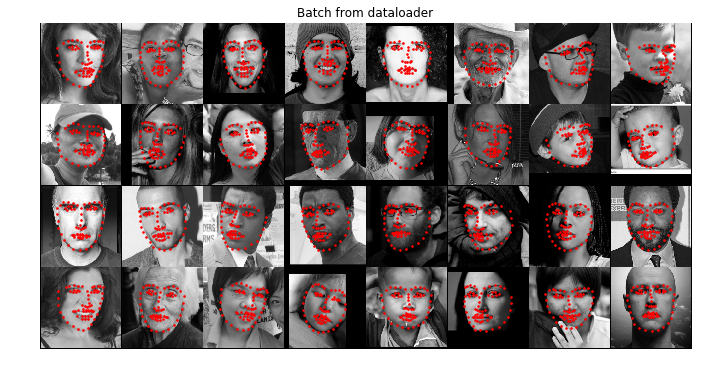

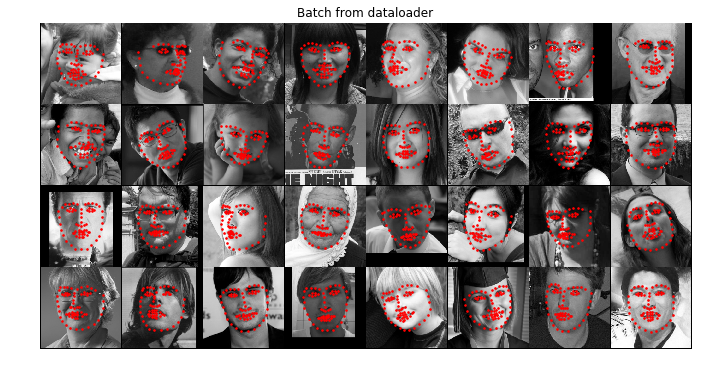

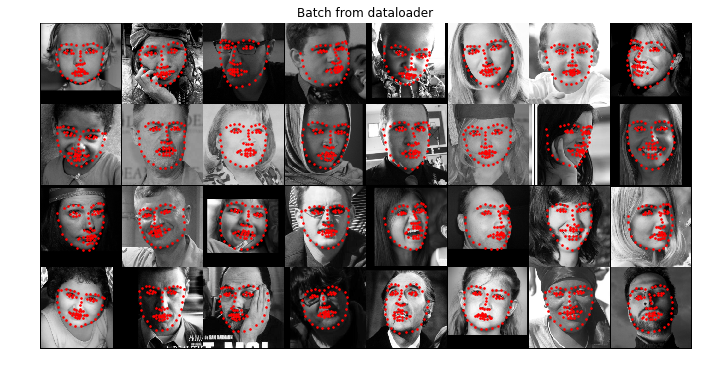

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [34]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [35]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

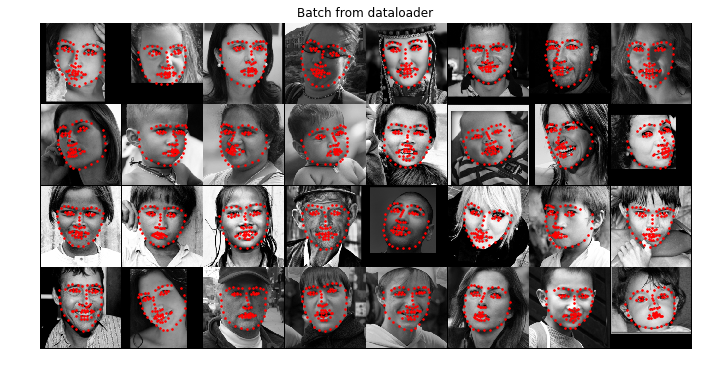

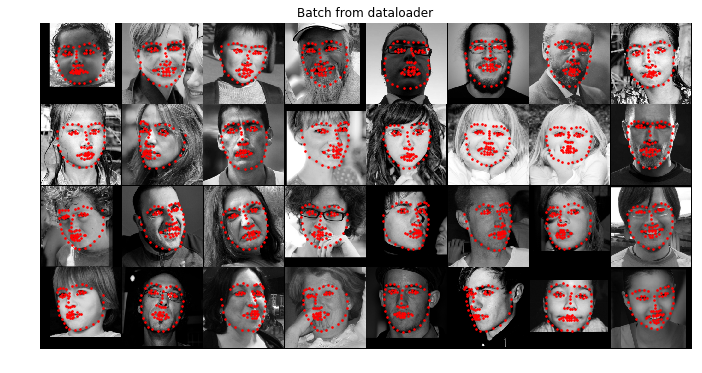

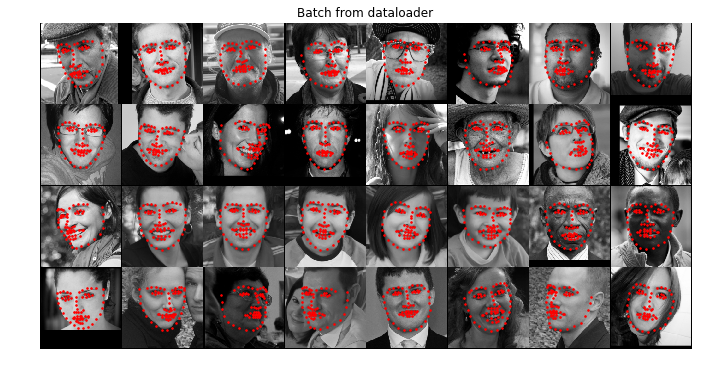

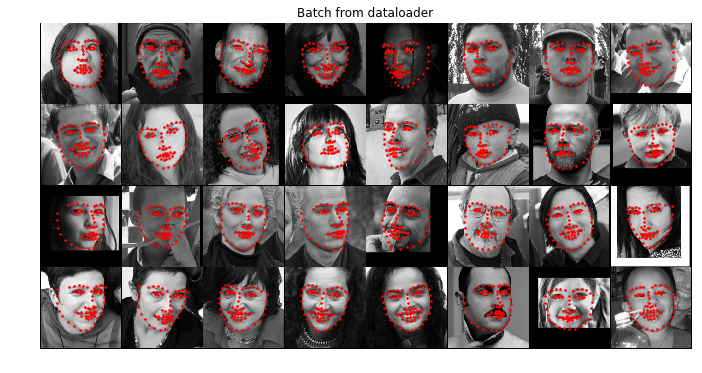

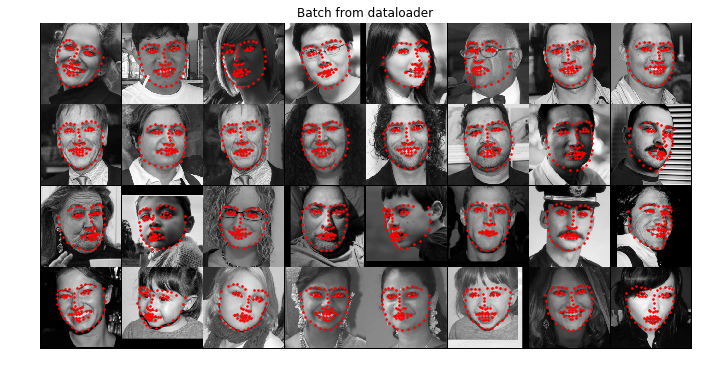

...

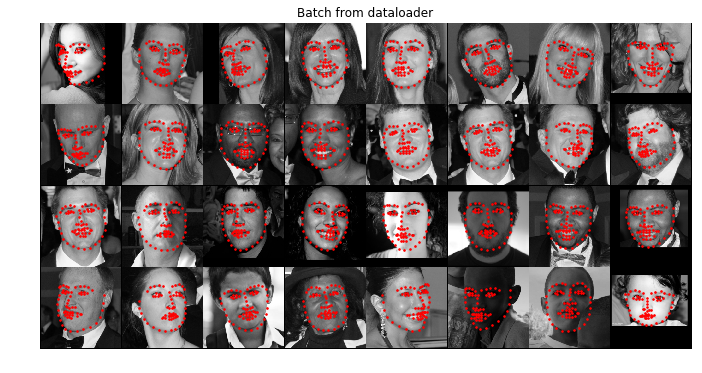

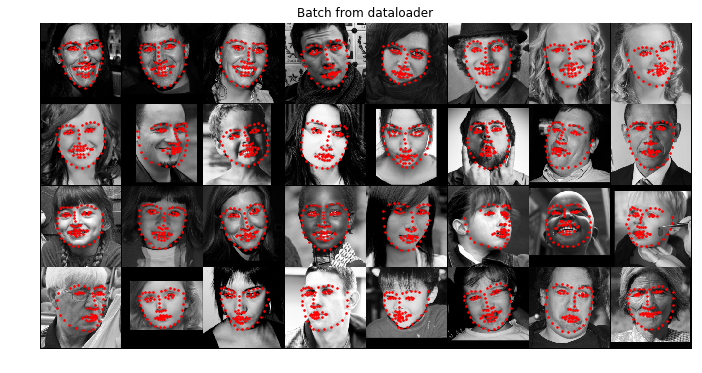

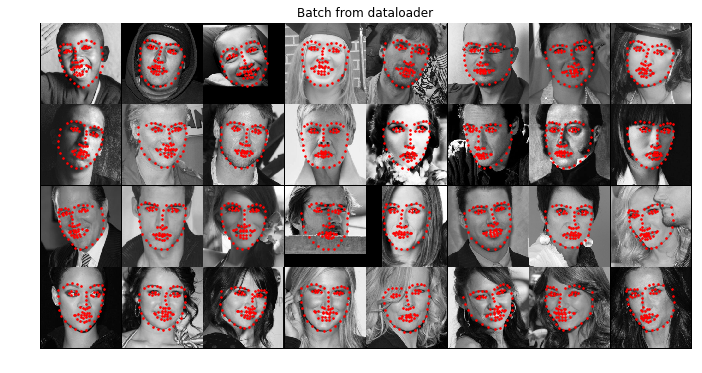

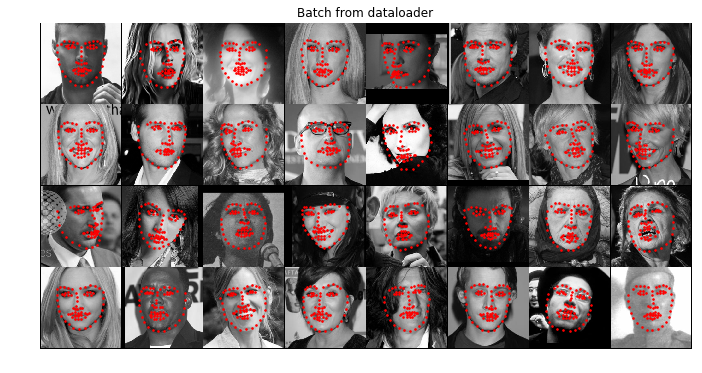

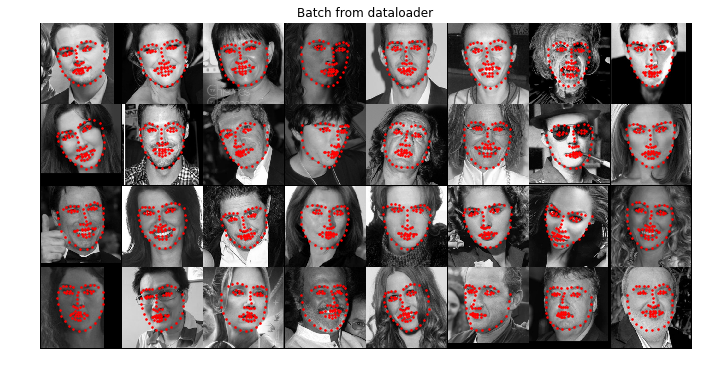

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


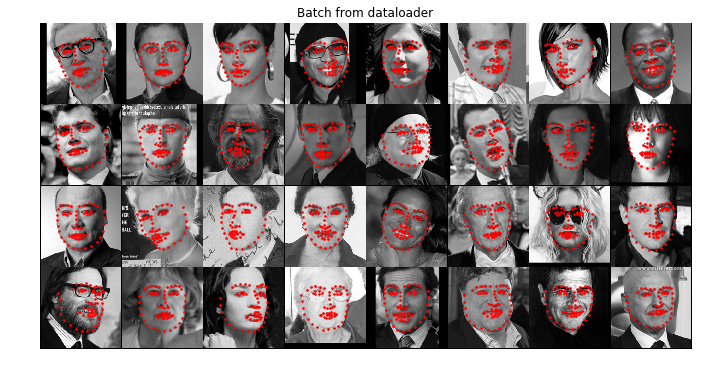

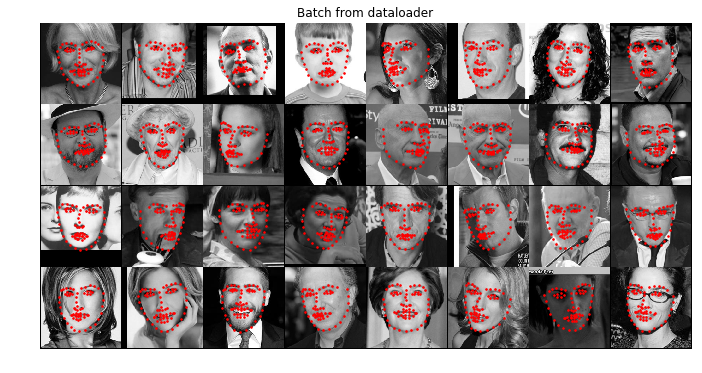

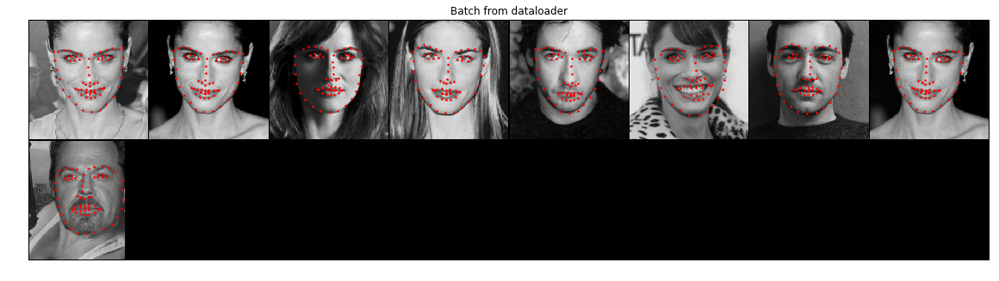

In [36]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [37]:
loss/len(dataset)

0.05701850263391761

### Challenging test

In [38]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

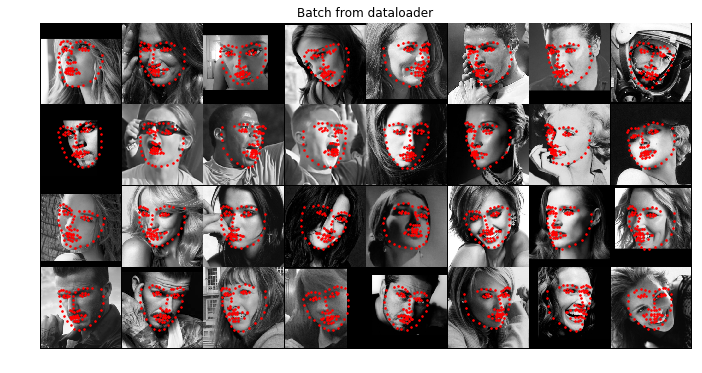

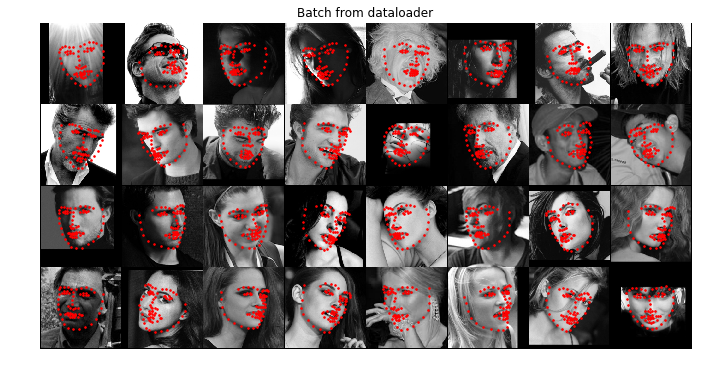

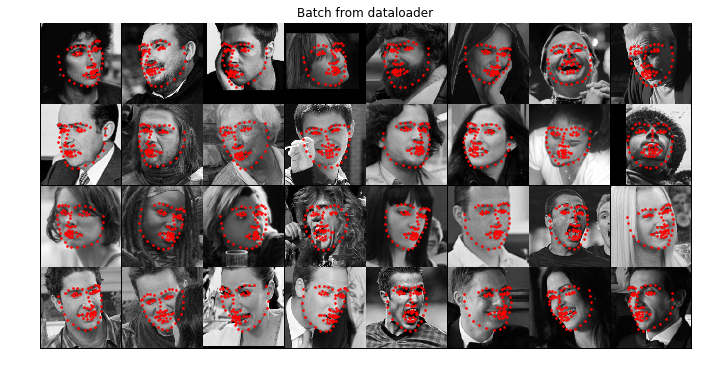

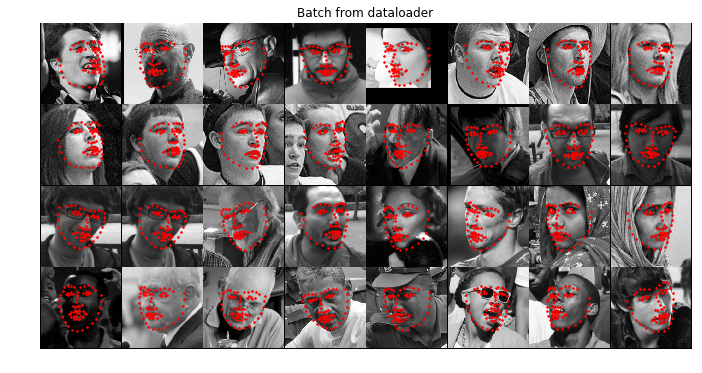

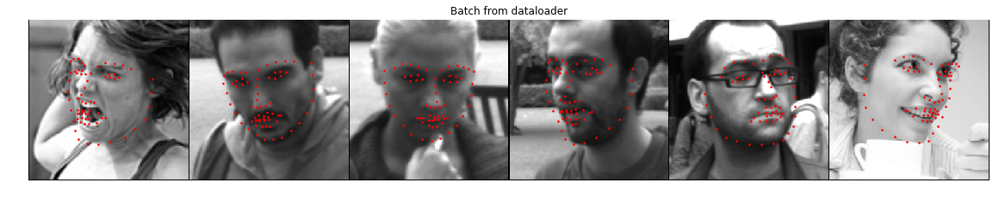

In [39]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [40]:
loss/len(challenging_set)

0.12855020529632247